# Name - Aditi Sharma
# Task 3 - Exploratory Data Analysis on Dataset - Terrorism (Intermediate)
# As a security/defense analyst, try to find out the hot zone of terrorism.

In [114]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import sklearn

In [128]:
df = pd.read_csv("globalterrorismdb_0718dist.csv", low_memory=False)
df

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,197000000001,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,197000000002,1970,0,0,NaN,0,NaN,130,Mexico,1,...,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,197001000001,1970,1,0,NaN,0,NaN,160,Philippines,5,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
3,197001000002,1970,1,0,NaN,0,NaN,78,Greece,8,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
4,197001000003,1970,1,0,NaN,0,NaN,101,Japan,4,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181686,201712310022,2017,12,31,NaN,0,NaN,182,Somalia,11,...,NaN,"""Somalia: Al-Shabaab Militants Attack Army Che...","""Highlights: Somalia Daily Media Highlights 2 ...","""Highlights: Somalia Daily Media Highlights 1 ...",START Primary Collection,0,0,0,0,NaN
181687,201712310029,2017,12,31,NaN,0,NaN,200,Syria,10,...,NaN,"""Putin's 'victory' in Syria has turned into a ...","""Two Russian soldiers killed at Hmeymim base i...","""Two Russian servicemen killed in Syria mortar...",START Primary Collection,-9,-9,1,1,NaN
181688,201712310030,2017,12,31,NaN,0,NaN,160,Philippines,5,...,NaN,"""Maguindanao clashes trap tribe members,"" Phil...",NaN,NaN,START Primary Collection,0,0,0,0,NaN
181689,201712310031,2017,12,31,NaN,0,NaN,92,India,6,...,NaN,"""Trader escapes grenade attack in Imphal,"" Bus...",NaN,NaN,START Primary Collection,-9,-9,0,-9,NaN


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Columns: 135 entries, eventid to related
dtypes: float64(55), int64(22), object(58)
memory usage: 187.1+ MB


In [4]:
df.columns

Index(['eventid', 'iyear', 'imonth', 'iday', 'approxdate', 'extended',
       'resolution', 'country', 'country_txt', 'region',
       ...
       'addnotes', 'scite1', 'scite2', 'scite3', 'dbsource', 'INT_LOG',
       'INT_IDEO', 'INT_MISC', 'INT_ANY', 'related'],
      dtype='object', length=135)

## Cleaning Data

In [5]:
df.rename(columns={'iyear':'Year','imonth':'Month', 'iday':'Day', 'country_txt':'Country', 'region_txt':'Region', 'provstate':'State', 'city':'City', 
                   'attacktype1_txt':'Attacktype', 'target1':'Target','nkill':'Nkill', 'nwound':'NWound','summary':'Summary', 
                   'weaptype1_txt':'Weapontype','motive':'Motive', 'crit1':'Crit1', 'crit2':'Crit2', 'crit3':'Crit3', 'success':'Success', 'suicide':'Suicide', 
                   'targtype1_txt':'Targettype', 'natlty1_txt':'Natlty1', 'natlty2_txt':'Natlty2', 'natlty3_txt':'Natlty3',
                   'gname':'Gname', 'guncertain1':'Guncertain1', 'claimed':'Claimed'}, inplace=True)

In [6]:
df2 = df[[ 'Year', 'Month', 'Country','State', 'Region', 'City','latitude','longitude', 
                  'Success', 'Suicide', 'Attacktype', 'Targettype','Gname', 
                  'Claimed', 'Weapontype', 'Nkill','NWound', 'Motive']]
# df2.astype(int64)
df2.head()

,Year,Month,Country,State,Region,City,latitude,longitude,Success,Suicide,Attacktype,Targettype,Gname,Claimed,Weapontype,Nkill,NWound,Motive
0,1970,7,Dominican Republic,NaN,Central America & Caribbean,Santo Domingo,18.456792,-69.951164,1,0,Assassination,Private Citizens & Property,MANO-D,NaN,Unknown,1.0,0.0,NaN
1,1970,0,Mexico,Federal,North America,Mexico city,19.371887,-99.086624,1,0,Hostage Taking (Kidnapping),Government (Diplomatic),23rd of September Communist League,NaN,Unknown,0.0,0.0,NaN
2,1970,1,Philippines,Tarlac,Southeast Asia,Unknown,15.478598,120.599741,1,0,Assassination,Journalists & Media,Unknown,NaN,Unknown,1.0,0.0,NaN
3,1970,1,Greece,Attica,Western Europe,Athens,37.997490,23.762728,1,0,Bombing/Explosion,Government (Diplomatic),Unknown,NaN,Explosives,NaN,NaN,NaN
4,1970,1,Japan,Fukouka,East Asia,Fukouka,33.580412,130.396361,1,0,Facility/Infrastructure Attack,Government (Diplomatic),Unknown,NaN,Incendiary,NaN,NaN,NaN


In [7]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Data columns (total 18 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   Year        181691 non-null  int64  
 1   Month       181691 non-null  int64  
 2   Country     181691 non-null  object 
 3   State       181270 non-null  object 
 4   Region      181691 non-null  object 
 5   City        181257 non-null  object 
 6   latitude    177135 non-null  float64
 7   longitude   177134 non-null  float64
 8   Success     181691 non-null  int64  
 9   Suicide     181691 non-null  int64  
 10  Attacktype  181691 non-null  object 
 11  Targettype  181691 non-null  object 
 12  Gname       181691 non-null  object 
 13  Claimed     115571 non-null  float64
 14  Weapontype  181691 non-null  object 
 15  Nkill       171378 non-null  float64
 16  NWound      165380 non-null  float64
 17  Motive      50561 non-null   object 
dtypes: float64(5), int64(4), object(9)
memory us

## Analysis 

In [8]:
df2.shape

(181691, 18)

In [9]:
df2.isnull().sum()

Year               0
Month              0
Country            0
State            421
Region             0
City             434
latitude        4556
longitude       4557
Success            0
Suicide            0
Attacktype         0
Targettype         0
Gname              0
Claimed        66120
Weapontype         0
Nkill          10313
NWound         16311
Motive        131130
dtype: int64

In [10]:
df2['Nkill']=df2['Nkill'].fillna(0)
df2['NWound']=df2['NWound'].fillna(0)
df2

<ipython-input-10-71f35c5bddc5>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2['Nkill']=df2['Nkill'].fillna(0)
<ipython-input-10-71f35c5bddc5>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2['NWound']=df2['NWound'].fillna(0)


,Year,Month,Country,State,Region,City,latitude,longitude,Success,Suicide,Attacktype,Targettype,Gname,Claimed,Weapontype,Nkill,NWound,Motive
0,1970,7,Dominican Republic,NaN,Central America & Caribbean,Santo Domingo,18.456792,-69.951164,1,0,Assassination,Private Citizens & Property,MANO-D,NaN,Unknown,1.0,0.0,NaN
1,1970,0,Mexico,Federal,North America,Mexico city,19.371887,-99.086624,1,0,Hostage Taking (Kidnapping),Government (Diplomatic),23rd of September Communist League,NaN,Unknown,0.0,0.0,NaN
2,1970,1,Philippines,Tarlac,Southeast Asia,Unknown,15.478598,120.599741,1,0,Assassination,Journalists & Media,Unknown,NaN,Unknown,1.0,0.0,NaN
3,1970,1,Greece,Attica,Western Europe,Athens,37.997490,23.762728,1,0,Bombing/Explosion,Government (Diplomatic),Unknown,NaN,Explosives,0.0,0.0,NaN
4,1970,1,Japan,Fukouka,East Asia,Fukouka,33.580412,130.396361,1,0,Facility/Infrastructure Attack,Government (Diplomatic),Unknown,NaN,Incendiary,0.0,0.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181686,2017,12,Somalia,Middle Shebelle,Sub-Saharan Africa,Ceelka Geelow,2.359673,45.385034,1,0,Armed Assault,Military,Al-Shabaab,1.0,Firearms,1.0,2.0,NaN
181687,2017,12,Syria,Lattakia,Middle East & North Africa,Jableh,35.407278,35.942679,1,0,Bombing/Explosion,Military,Muslim extremists,0.0,Explosives,2.0,7.0,NaN
181688,2017,12,Philippines,Maguindanao,Southeast Asia,Kubentog,6.900742,124.437908,1,0,Facility/Infrastructure Attack,Private Citizens & Property,Bangsamoro Islamic Freedom Movement (BIFM),0.0,Incendiary,0.0,0.0,NaN
181689,2017,12,India,Manipur,South Asia,Imphal,24.798346,93.940430,0,0,Bombing/Explosion,Government (General),Unknown,0.0,Explosives,0.0,0.0,NaN


In [11]:
df2.describe()

,Year,Month,latitude,longitude,Success,Suicide,Claimed,Nkill,NWound
count,181691.000000,181691.000000,177135.000000,1.771340e+05,181691.000000,181691.000000,115571.000000,181691.000000,181691.000000
mean,2002.638997,6.467277,23.498343,-4.586957e+02,0.889598,0.036507,0.049666,2.266860,2.883296
std,13.259430,3.388303,18.569242,2.047790e+05,0.313391,0.187549,1.093195,11.227057,34.309747
min,1970.000000,0.000000,-53.154613,-8.618590e+07,0.000000,0.000000,-9.000000,0.000000,0.000000
25%,1991.000000,4.000000,11.510046,4.545640e+00,1.000000,0.000000,0.000000,0.000000,0.000000
50%,2009.000000,6.000000,31.467463,4.324651e+01,1.000000,0.000000,0.000000,0.000000,0.000000
75%,2014.000000,9.000000,34.685087,6.871033e+01,1.000000,0.000000,0.000000,2.000000,2.000000
max,2017.000000,12.000000,74.633553,1.793667e+02,1.000000,1.000000,1.000000,1570.000000,8191.000000


In [12]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Data columns (total 18 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   Year        181691 non-null  int64  
 1   Month       181691 non-null  int64  
 2   Country     181691 non-null  object 
 3   State       181270 non-null  object 
 4   Region      181691 non-null  object 
 5   City        181257 non-null  object 
 6   latitude    177135 non-null  float64
 7   longitude   177134 non-null  float64
 8   Success     181691 non-null  int64  
 9   Suicide     181691 non-null  int64  
 10  Attacktype  181691 non-null  object 
 11  Targettype  181691 non-null  object 
 12  Gname       181691 non-null  object 
 13  Claimed     115571 non-null  float64
 14  Weapontype  181691 non-null  object 
 15  Nkill       181691 non-null  float64
 16  NWound      181691 non-null  float64
 17  Motive      50561 non-null   object 
dtypes: float64(5), int64(4), object(9)
memory us

In [13]:
# using dictionary to convert specific columns
convert_dict = {'Nkill': int,
                'NWound': int,
               }
  
df2 = df2.astype(convert_dict)
print(df2.dtypes)

Year            int64
Month           int64
Country        object
State          object
Region         object
City           object
latitude      float64
longitude     float64
Success         int64
Suicide         int64
Attacktype     object
Targettype     object
Gname          object
Claimed       float64
Weapontype     object
Nkill           int32
NWound          int32
Motive         object
dtype: object


## Insights

In [14]:
print('Country with Maximum Terrorist Attacks:',df2['Country'].value_counts().idxmax())
print('Maximum people killed',df2['Nkill'].max())
print('Maximum Wounded',df2['NWound'].max())
print('Year with most attacks', df2['Year'].value_counts().idxmax())
print("Most Attack Types:",df2['Attacktype'].value_counts().idxmax())
print("Most Target Types:",df2['Targettype'].value_counts().idxmax())
print("Most Weapon Types:",df2['Weapontype'].value_counts().idxmax())
print("Group with the most attacks:",df2['Gname'].value_counts().index[1])

Country with Maximum Terrorist Attacks: Iraq
Maximum people killed 1570
Maximum Wounded 8191
Year with most attacks 2014
Most Attack Types: Bombing/Explosion
Most Target Types: Private Citizens & Property
Most Weapon Types: Explosives
Group with the most attacks: Taliban


In [15]:
attack = df2.Country.value_counts()[:10]
attack

Iraq              24636
Pakistan          14368
Afghanistan       12731
India             11960
Colombia           8306
Philippines        6908
Peru               6096
El Salvador        5320
United Kingdom     5235
Turkey             4292
Name: Country, dtype: int64


## Visualizations 

### Distribution of data on each column

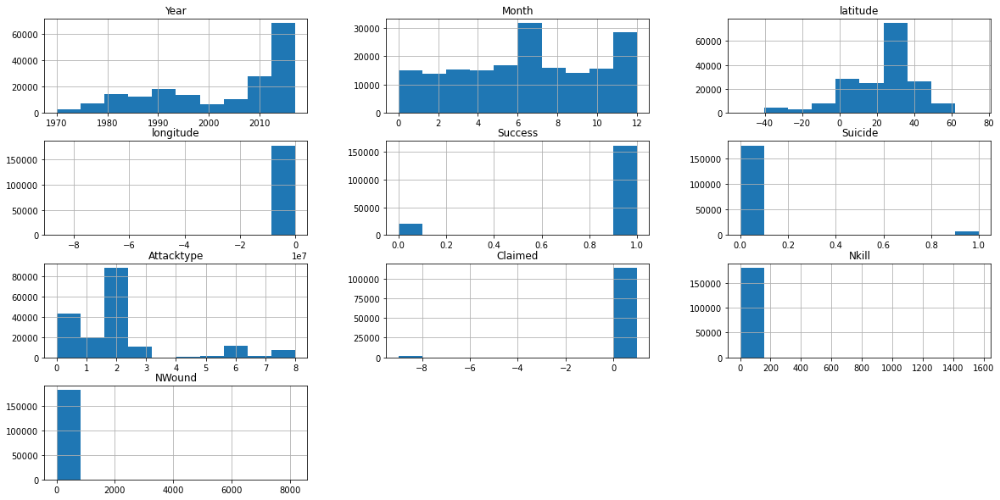

In [88]:
df2.hist(figsize=(20,10))
plt.show()

<AxesSubplot:title={'center':'Country-wise attacks'}>

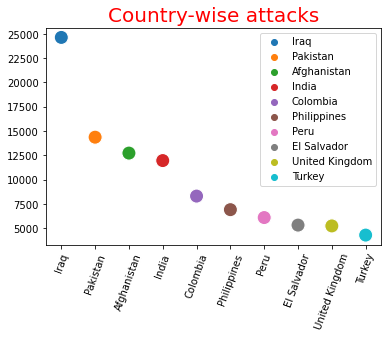

In [16]:
country = df2['Country'].value_counts()[:10].index
attacks = df2['Country'].value_counts()[:10].values

plt.title("Country-wise attacks", fontsize = 20, color = 'red')
plt.xticks(rotation = 70)
sns.scatterplot(x=country, y=attacks, s= 200, hue=country)

In [96]:
killed =df2[['Year','Nkill']].groupby('Year').sum()
killed.head()

,Nkill
Year,
1970,174
1971,173
1972,566
1973,370
1974,539


Text(0, 0.5, 'No. of people Killed')

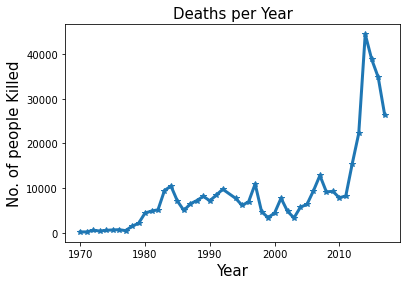

In [89]:
plt.plot(killed,lw='3',marker='*')
plt.title("Deaths per Year", size=15)
plt.xlabel('Year',size=15)
plt.ylabel('No. of people Killed', size=15)

In [95]:
wounded = df2[['Year','NWound']].groupby('Year').sum()
wounded.head()

,NWound
Year,
1970,212
1971,82
1972,409
1973,495
1974,865


Text(0, 0.5, 'No. of People wounded')

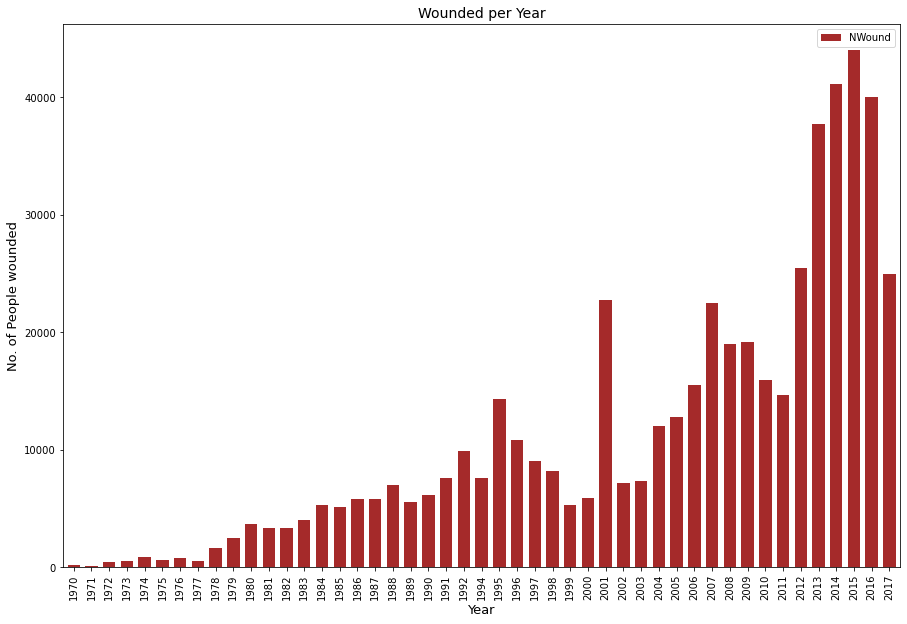

In [60]:
wounded.plot(kind='bar', width = 0.7, figsize= (15,10), color='brown')
plt.title('Wounded per Year', fontsize = 14)
plt.xlabel('Year',fontsize = 13)
plt.ylabel('No. of People wounded',fontsize = 13)

In [94]:
attacktype = df2[['Year','Attacktype']].groupby('Year').sum()
attacktype.head()

,Attacktype
Year,
1970,1566
1971,985
1972,870
1973,924
1974,1149


In [69]:
grp = df['Gname'].value_counts()[1:10]
grp

Taliban                                             7478
Islamic State of Iraq and the Levant (ISIL)         5613
Shining Path (SL)                                   4555
Farabundo Marti National Liberation Front (FMLN)    3351
Al-Shabaab                                          3288
New People's Army (NPA)                             2772
Irish Republican Army (IRA)                         2671
Revolutionary Armed Forces of Colombia (FARC)       2487
Boko Haram                                          2418
Name: Gname, dtype: int64

Text(0, 0.5, 'No. of Attacks')

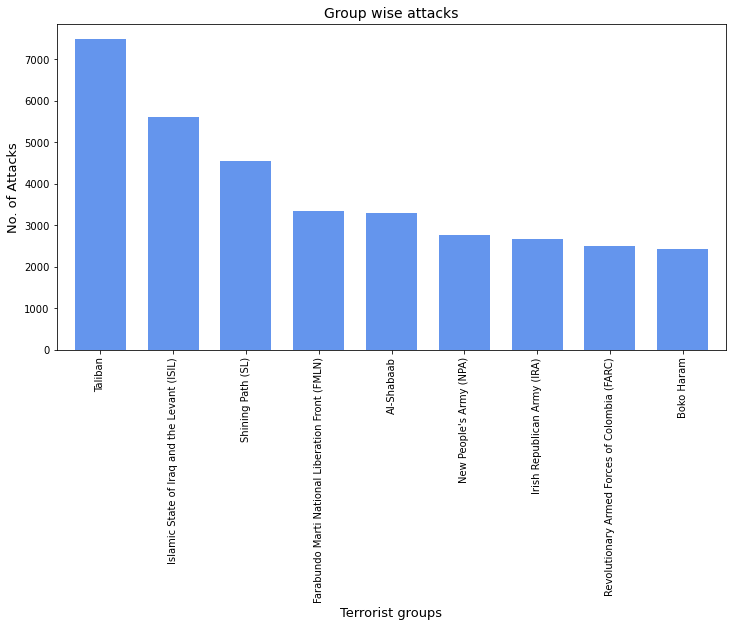

In [108]:
grp.plot(kind='bar', width = 0.7, figsize= (12,6), color='cornflowerblue')
plt.title('Group wise attacks', fontsize = 14)
plt.xlabel('Terrorist groups',fontsize = 13)
plt.ylabel('No. of Attacks',fontsize = 13)

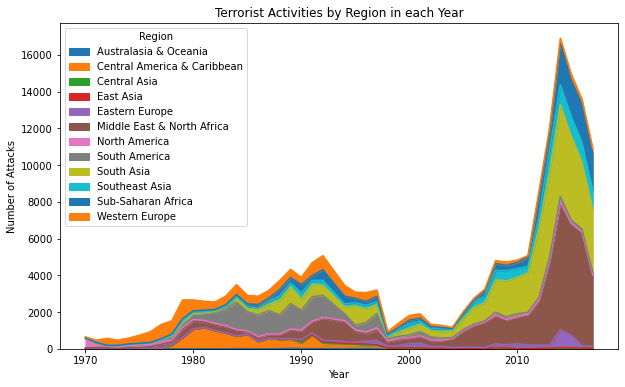

In [22]:
pd.crosstab(df2.Year, df2.Region).plot(kind='area',figsize=(10,6))
plt.title('Terrorist Activities by Region in each Year')
plt.ylabel('Number of Attacks')
plt.show()

### Successful Attacks 
#### successful - 160000, unsuccessful - 20000

<AxesSubplot:xlabel='Success', ylabel='count'>

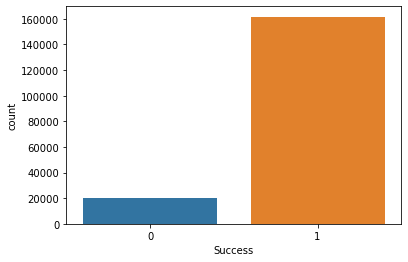

In [102]:
sns.countplot(x =df2['Success'])

## No. of Deaths 

In [120]:
fig = px.choropleth(df, locations='Country',locationmode='country names',color='Nkill',animation_group='Nkill',animation_frame='Year',
                   labels = {'Year','Nkill','Country'},
                   title = 'Number of Deaths in a year in diff countries')
fig.show()

In [126]:
df2['Casuality']=df2['Nkill']+df2['NWound']
df2['Casuality']

0         1
1         0
2         1
3         0
4         0
         ..
181686    3
181687    9
181688    0
181689    0
181690    0
Name: Casuality, Length: 181691, dtype: int32

In [127]:
fig = px.treemap(df2, values='Casuality',
                path=['Region','Attacktype',],
                color_discrete_sequence = px.colors.qualitative.Dark24,
                title = 'Treemap Chart: Grouping Attacked groups in different regions')
fig.show()